In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.applications import InceptionV3

In [ ]:
from keras.applications import VGG16
from keras.models import Sequential
from keras.layers import Dense, Dropout, GlobalAveragePooling2D
from keras.preprocessing.image import ImageDataGenerator
from keras.applications.vgg16 import preprocess_input
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    vertical_flip=True,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    preprocessing_function=preprocess_input,
    fill_mode='nearest',
    brightness_range = (0.5, 1.5),
)

batch_size = 32

train_generator = datagen.flow_from_directory(
    '/content/drive/MyDrive/mmds4/mmds-20231225T212418Z-001/mmds/train',
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode='binary',shuffle=True,seed=1
)

validation_generator = datagen.flow_from_directory(
    '/content/drive/MyDrive/mmds4/mmds-20231225T212418Z-001/mmds/valid',
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode='binary',shuffle=True,seed=1
)

test_generator = datagen.flow_from_directory(
    '/content/drive/MyDrive/mmds4/mmds-20231225T212418Z-001/mmds/test',
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode='binary',shuffle=True,seed=1
)

Found 924 images belonging to 2 classes.
Found 215 images belonging to 2 classes.
Found 135 images belonging to 2 classes.


In [ ]:
class_names = ["plain","pothole"]
for i in range(len(class_names)):
    print(i," ",class_names[i])

0   plain
1   pothole


In [ ]:
from keras.applications import MobileNet
from keras.models import Sequential
from keras.layers import Dense, Dropout, GlobalAveragePooling2D
from keras.regularizers import l2


mobilenet_model = MobileNet(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

for layer in mobilenet_model.layers[-4:]:
    layer.trainable = True

model = Sequential([
    mobilenet_model,
    GlobalAveragePooling2D(),
    Dense(1024, activation='relu', kernel_regularizer=l2(0.01)),
    Dropout(0.5),
    Dense(512, activation='relu', kernel_regularizer=l2(0.01)),
    Dropout(0.5),
    Dense(2, activation='softmax')
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()


17225924/17225924 [==============================] - 0s 0us/step
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_224 (Functi  (None, 7, 7, 1024)        3228864   
 onal)                                                           
                                                                 
 global_average_pooling2d_1  (None, 1024)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_3 (Dense)             (None, 1024)              1049600   
                                                                 
 dropout_2 (Dropout)         (None, 1024)              0         
                                                                 
 dense_4 (Dense)             (None, 512)               524800    
                                                       

In [ ]:


model.compile(optimizer="adam", loss=keras.losses.SparseCategoricalCrossentropy(), metrics=['accuracy'])


early = tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=5)

In [ ]:

history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=20,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size
)


Epoch 1/20
 9/28 [========>.....................] - ETA: 10s - loss: 16.7858 - accuracy: 0.7743

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


28/28 [==============================] - 51s 1s/step - loss: 14.2179 - accuracy: 0.8800 - val_loss: 21.2992 - val_accuracy: 0.5312
Epoch 2/20
28/28 [==============================] - 30s 1s/step - loss: 8.5307 - accuracy: 0.9395 - val_loss: 12.9767 - val_accuracy: 0.6823
Epoch 3/20
28/28 [==============================] - 34s 1s/step - loss: 5.2154 - accuracy: 0.9675 - val_loss: 9.0878 - val_accuracy: 0.7135
Epoch 4/20
28/28 [==============================] - 30s 1s/step - loss: 3.2805 - accuracy: 0.9788 - val_loss: 4.8622 - val_accuracy: 0.7552
Epoch 5/20
28/28 [==============================] - 34s 1s/step - loss: 2.1198 - accuracy: 0.9742 - val_loss: 2.2327 - val_accuracy: 0.9115
Epoch 6/20
28/28 [==============================] - 30s 1s/step - loss: 1.3781 - accuracy: 0.9821 - val_loss: 1.3269 - val_accuracy: 0.9479
Epoch 7/20
28/28 [==============================] - 30s 1s/step - loss: 0.9506 - accuracy: 0.9821 - val_loss: 1.0781 - val_accuracy: 0.9167
Epoch 8/20
28/28 [==========

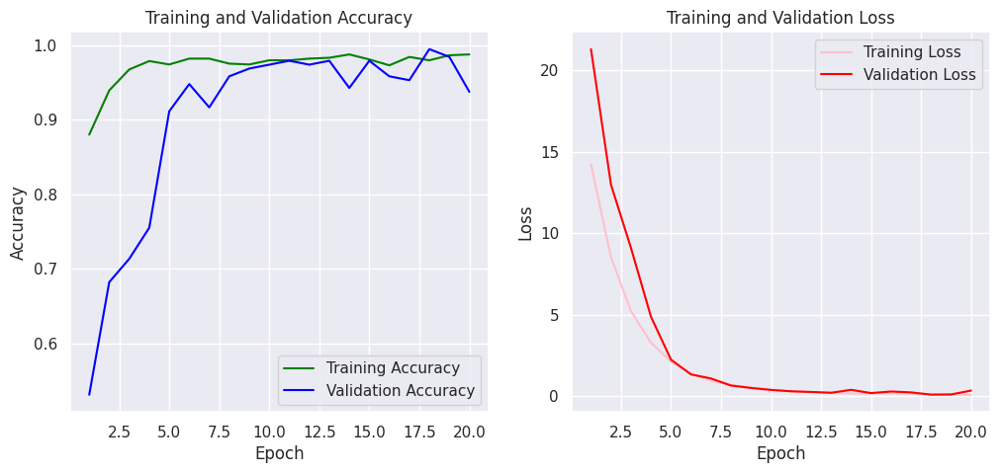

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)


plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs, acc, 'green', label='Training Accuracy')
plt.plot(epochs, val_acc, 'blue', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()


plt.subplot(1, 2, 2)
plt.plot(epochs, loss, 'pink', label='Training Loss')
plt.plot(epochs, val_loss, 'red', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()


1/1 [==============================] - 0s 462ms/step


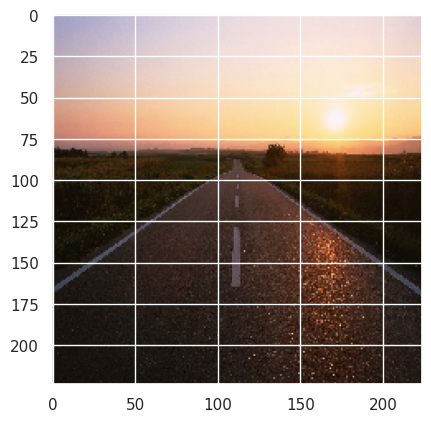

Predicted: Plain
1/1 [==============================] - 0s 37ms/step


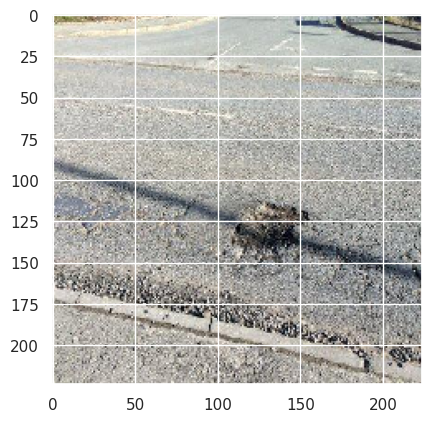

Predicted: Pothole
1/1 [==============================] - 0s 23ms/step


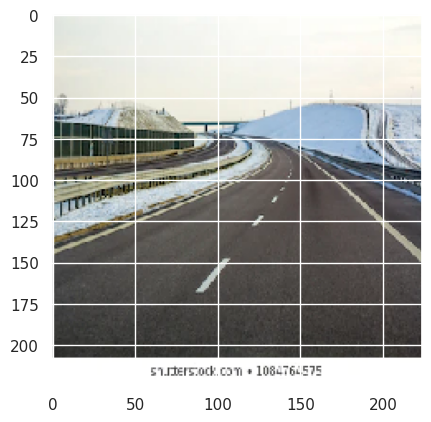

Predicted: Plain
1/1 [==============================] - 0s 21ms/step


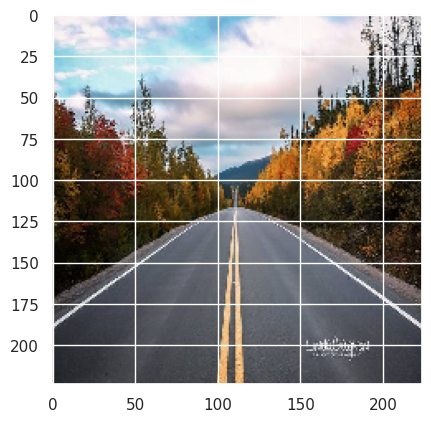

Predicted: Plain
1/1 [==============================] - 0s 26ms/step


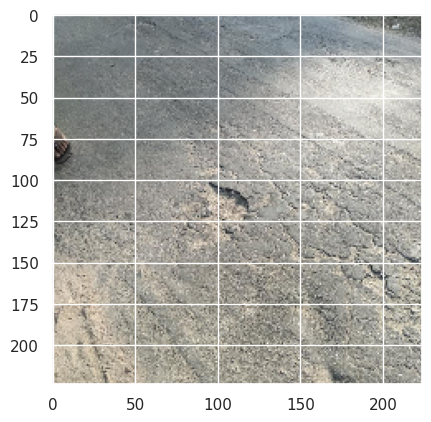

Predicted: Pothole
1/1 [==============================] - 0s 27ms/step


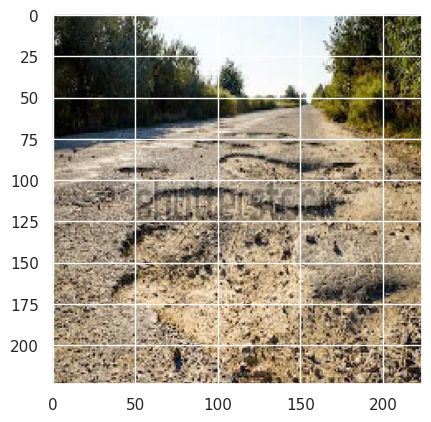

Predicted: Pothole
1/1 [==============================] - 0s 27ms/step


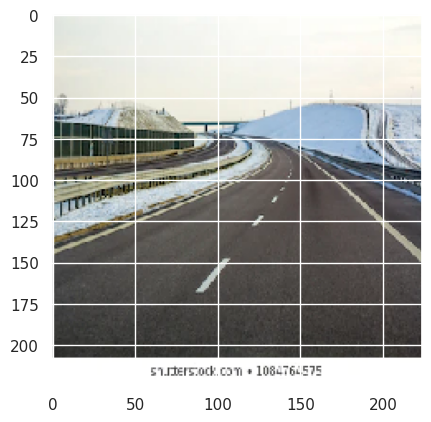

Predicted: Plain
1/1 [==============================] - 0s 21ms/step


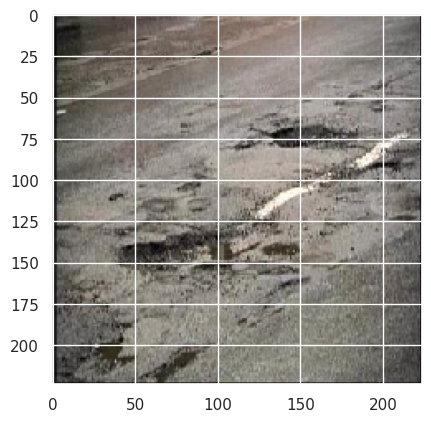

Predicted: Pothole
1/1 [==============================] - 0s 22ms/step


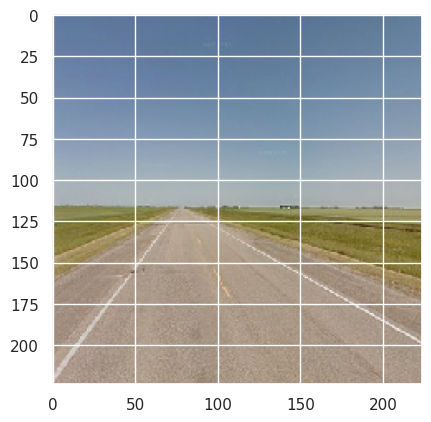

Predicted: Plain
1/1 [==============================] - 0s 36ms/step


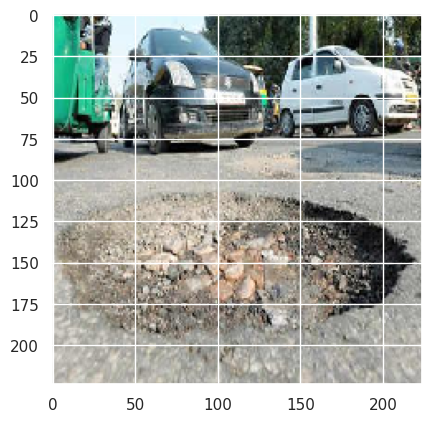

Predicted: Plain
1/1 [==============================] - 0s 28ms/step


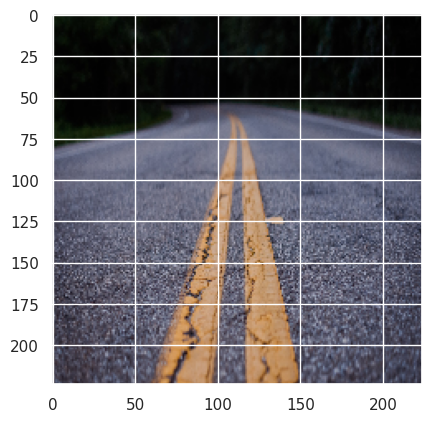

Predicted: Plain
1/1 [==============================] - 0s 36ms/step


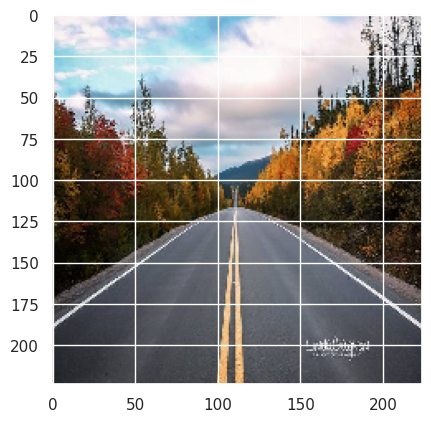

Predicted: Plain
1/1 [==============================] - 0s 30ms/step


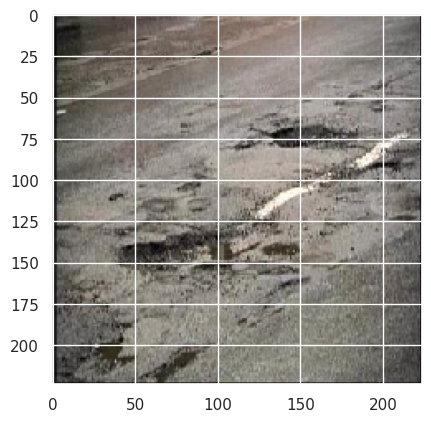

Predicted: Pothole
1/1 [==============================] - 0s 37ms/step


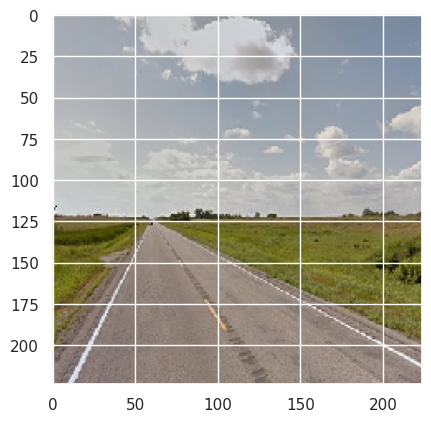

Predicted: Plain
1/1 [==============================] - 0s 31ms/step


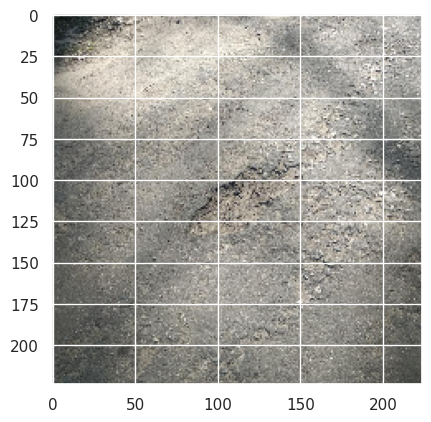

Predicted: Plain
1/1 [==============================] - 0s 35ms/step


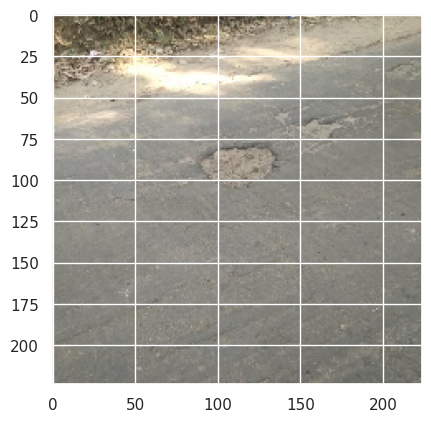

Predicted: Plain
1/1 [==============================] - 0s 40ms/step


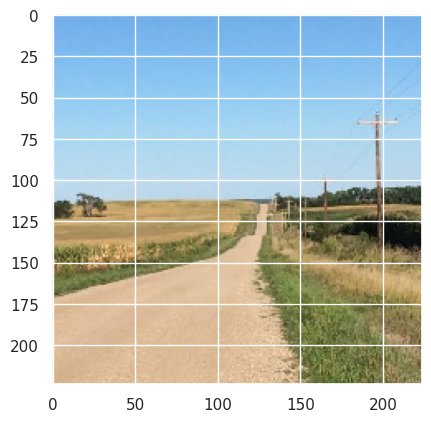

Predicted: Plain
1/1 [==============================] - 0s 30ms/step


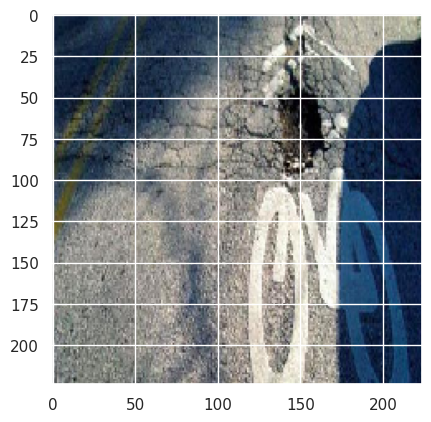

Predicted: Plain
1/1 [==============================] - 0s 31ms/step


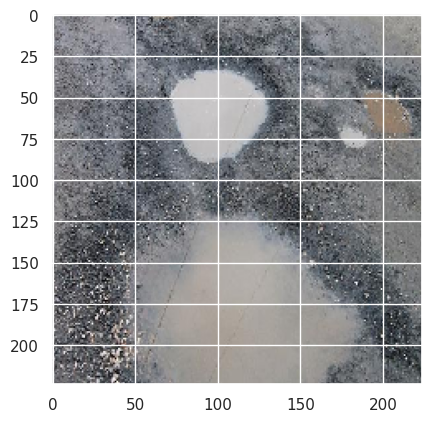

Predicted: Pothole
1/1 [==============================] - 0s 34ms/step


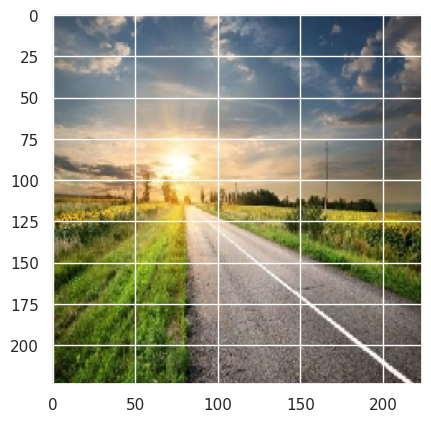

Predicted: Plain
1/1 [==============================] - 0s 65ms/step


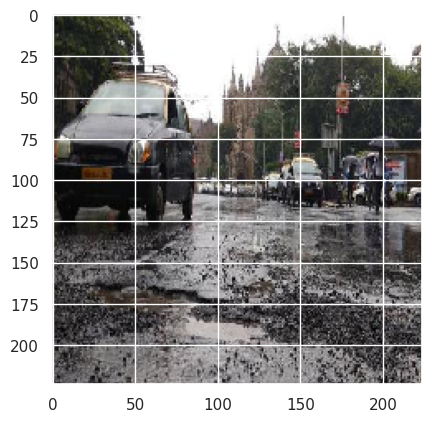

Predicted: Pothole
1/1 [==============================] - 0s 31ms/step


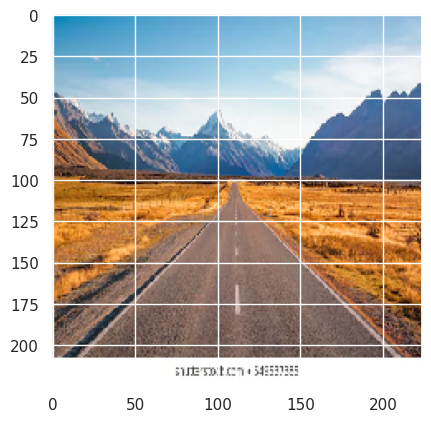

Predicted: Plain
1/1 [==============================] - 0s 31ms/step


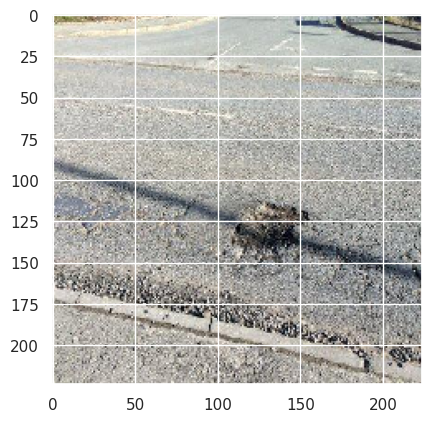

Predicted: Pothole
1/1 [==============================] - 0s 46ms/step


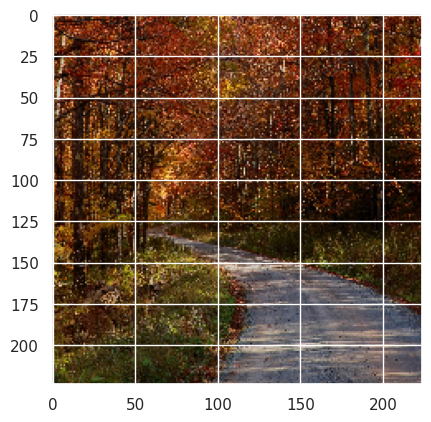

Predicted: Plain
1/1 [==============================] - 0s 32ms/step


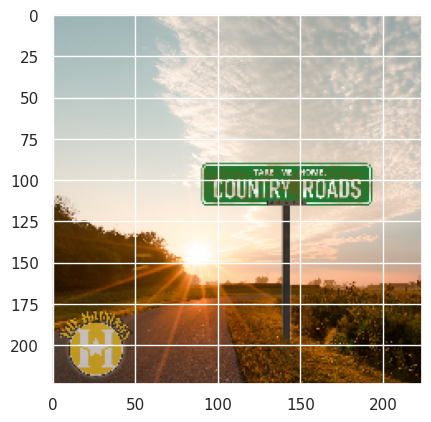

Predicted: Plain
1/1 [==============================] - 0s 31ms/step


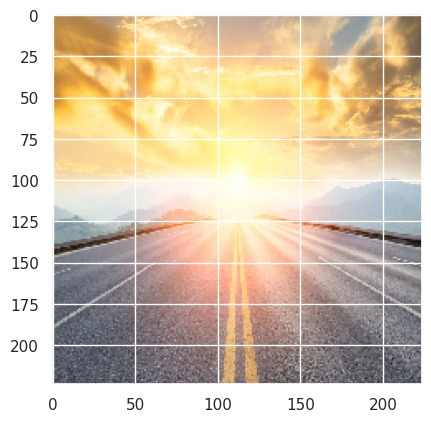

Predicted: Plain
1/1 [==============================] - 0s 31ms/step


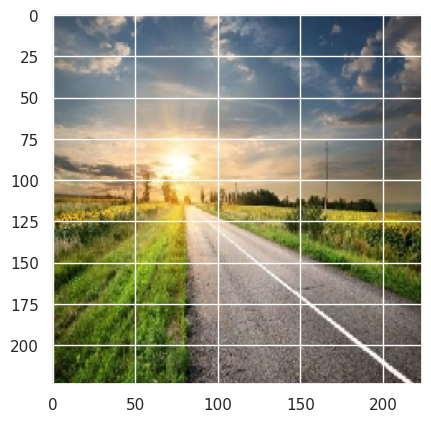

Predicted: Plain
1/1 [==============================] - 0s 30ms/step


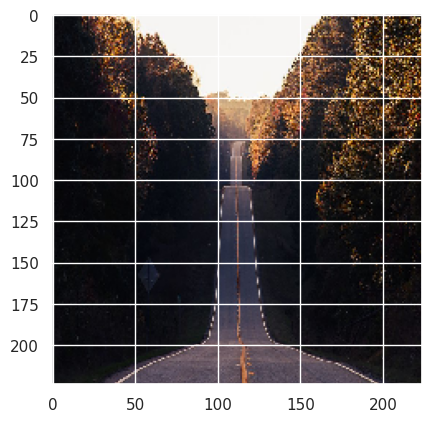

Predicted: Plain
1/1 [==============================] - 0s 33ms/step


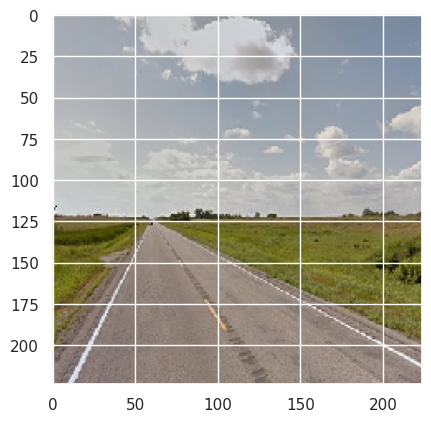

Predicted: Plain
1/1 [==============================] - 0s 31ms/step


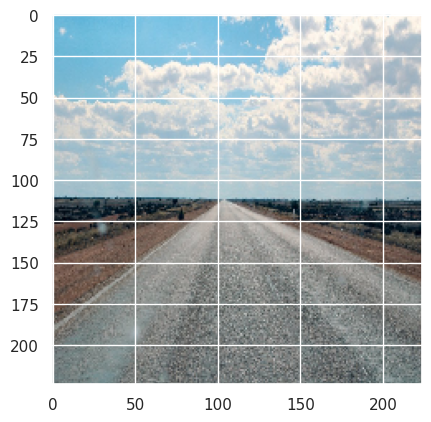

Predicted: Plain
1/1 [==============================] - 0s 32ms/step


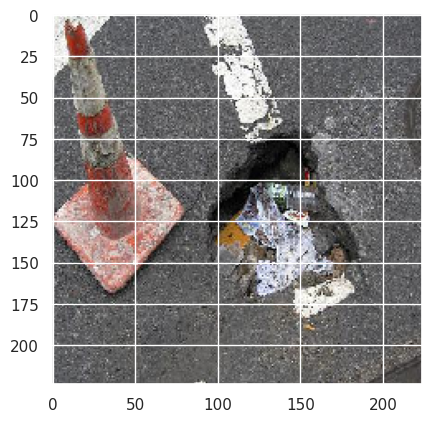

Predicted: Plain
1/1 [==============================] - 0s 30ms/step


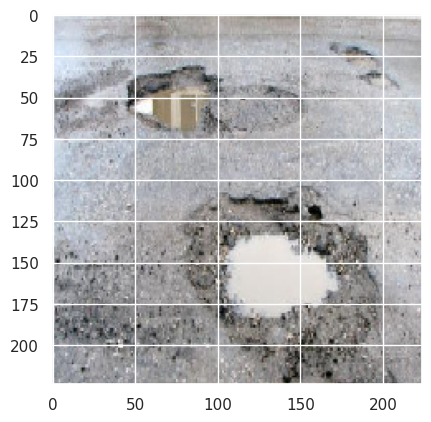

Predicted: Pothole
1/1 [==============================] - 0s 31ms/step


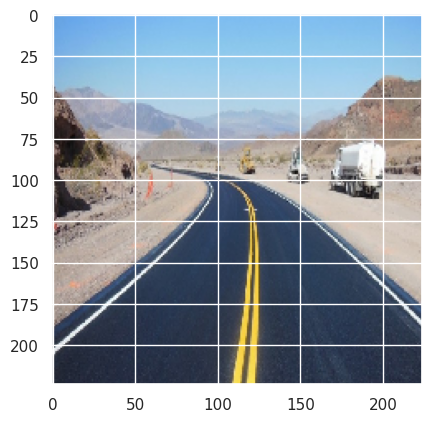

Predicted: Plain
1/1 [==============================] - 0s 30ms/step


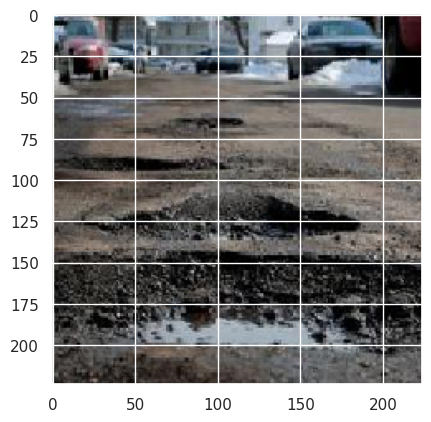

Predicted: Pothole
1/1 [==============================] - 0s 29ms/step


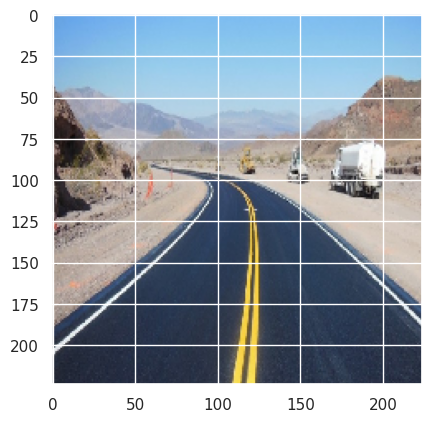

Predicted: Plain
1/1 [==============================] - 0s 31ms/step


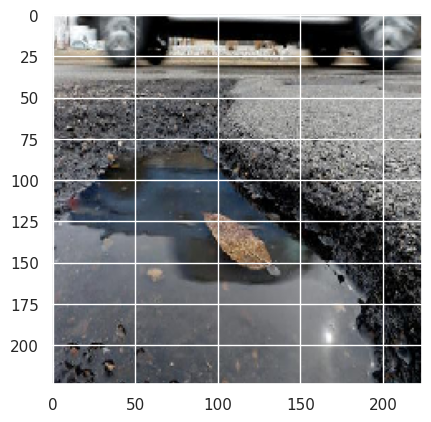

Predicted: Plain
1/1 [==============================] - 0s 35ms/step


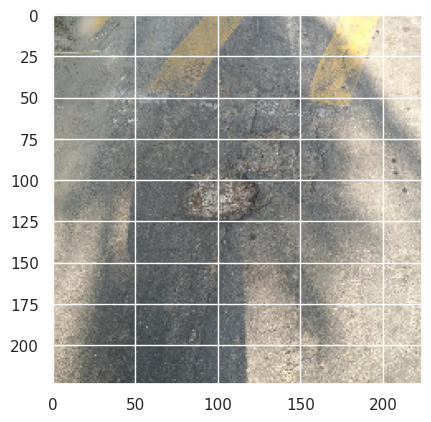

Predicted: Plain
1/1 [==============================] - 0s 30ms/step


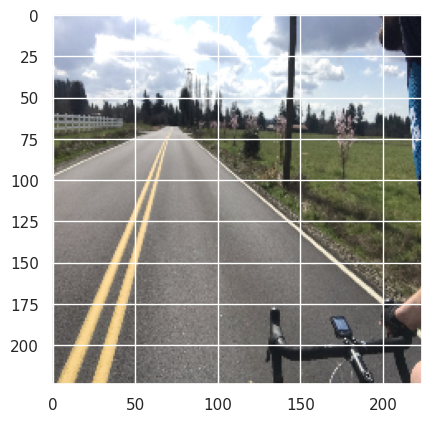

Predicted: Plain
1/1 [==============================] - 0s 31ms/step


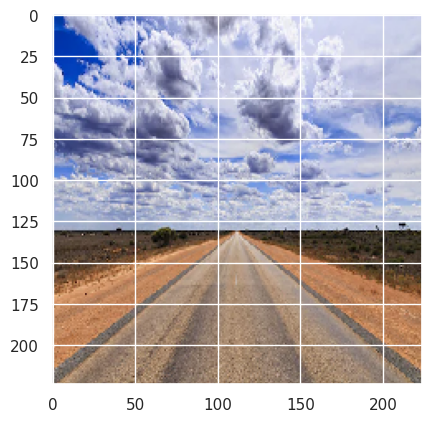

Predicted: Plain
1/1 [==============================] - 0s 36ms/step


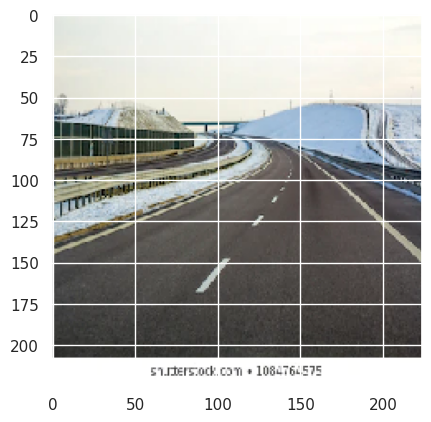

Predicted: Plain
1/1 [==============================] - 0s 32ms/step


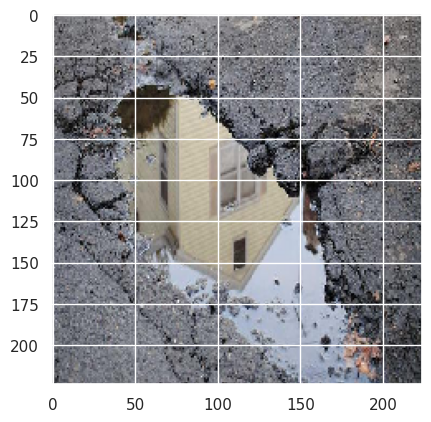

Predicted: Pothole
1/1 [==============================] - 0s 32ms/step


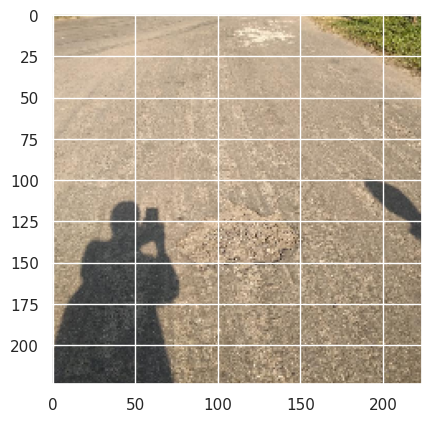

Predicted: Plain
1/1 [==============================] - 0s 39ms/step


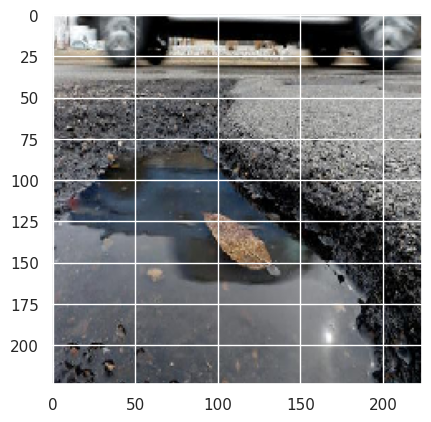

Predicted: Plain
1/1 [==============================] - 0s 32ms/step


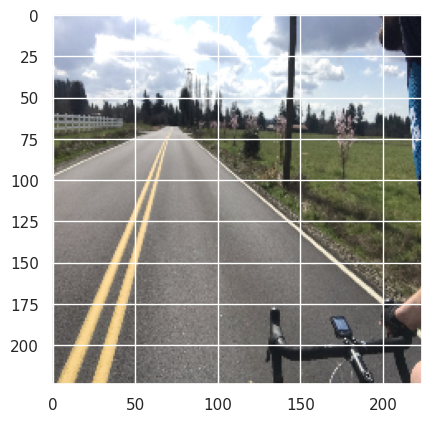

Predicted: Plain
1/1 [==============================] - 0s 32ms/step


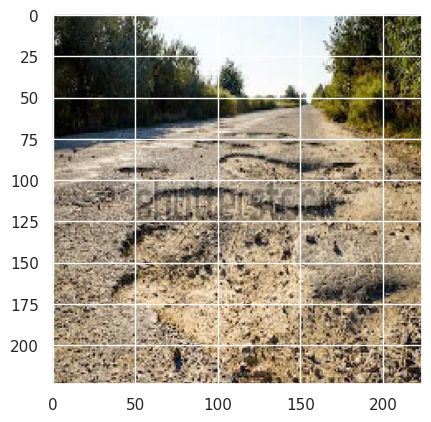

Predicted: Pothole
1/1 [==============================] - 0s 31ms/step


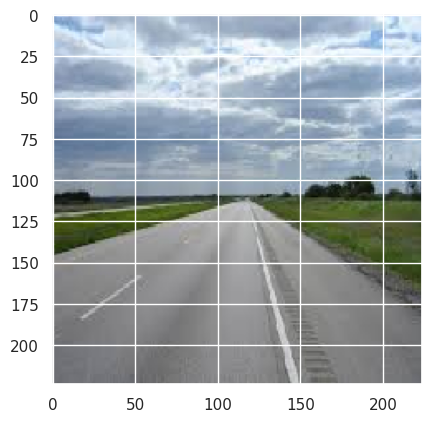

Predicted: Plain
1/1 [==============================] - 0s 33ms/step


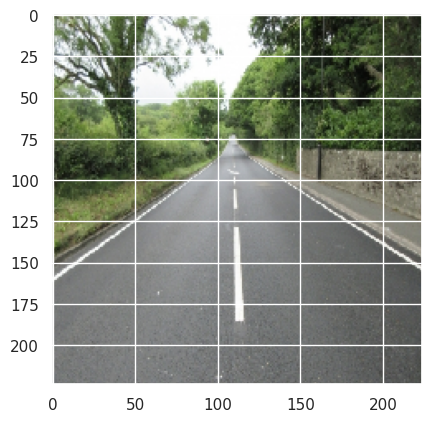

Predicted: Plain
1/1 [==============================] - 0s 37ms/step


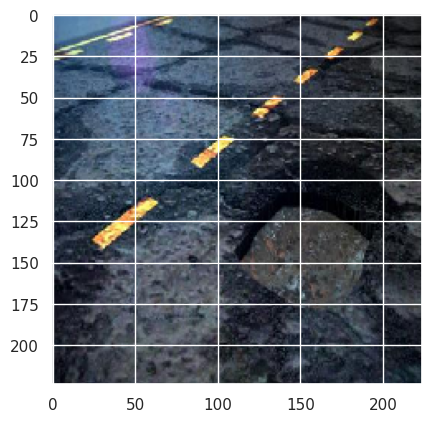

Predicted: Plain
1/1 [==============================] - 0s 37ms/step


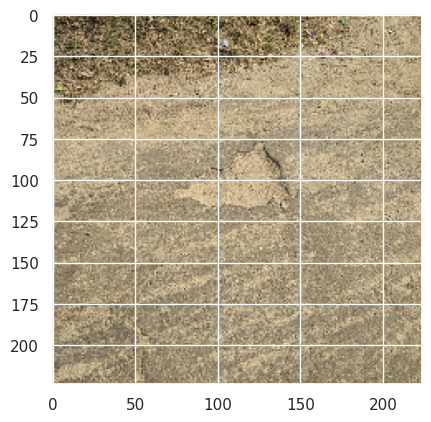

Predicted: Pothole
1/1 [==============================] - 0s 36ms/step


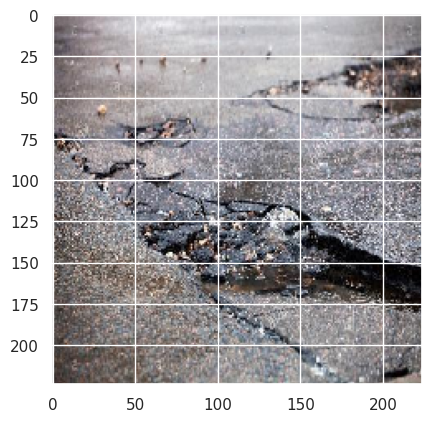

Predicted: Pothole


In [ ]:
from keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt
import os
import random

def visualize_predictions(classifier, n_cases, class_names):
    for i in range(n_cases):
        path = random.choice(['/content/drive/MyDrive/mmds4/mmds-20231225T212418Z-001/mmds/test/test_plain', '/content/drive/MyDrive/mmds4/mmds-20231225T212418Z-001/mmds/test/test_pothole'])

        random_img = random.choice(os.listdir(path))
        img_path = os.path.join(path, random_img)
        img = image.load_img(img_path, target_size=(224, 224))
        img_tensor = image.img_to_array(img)
        img_tensor = np.expand_dims(img_tensor, axis=0)
        img_tensor = preprocess_input(img_tensor)

        prediction = classifier.predict(img_tensor)
        prediction = np.argmax(prediction, axis=1)

        plt.imshow(img)
        plt.show()

        print(f"Predicted: {class_names[prediction[0]]}")


visualize_predictions(model, 50, ['Plain', 'Pothole'])


In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix
from keras.applications.vgg16 import preprocess_input

def gather_predictions(classifier, test_dir, n_cases, class_names):
    predictions = []
    true_labels = []

    for _ in range(n_cases):
        for class_index, class_name in enumerate(class_names):
            path = os.path.join(test_dir, class_name.lower())
            random_img = random.choice(os.listdir(path))
            img_path = os.path.join(path, random_img)
            img = image.load_img(img_path, target_size=(244, 244))
            img_tensor = image.img_to_array(img)
            img_tensor = np.expand_dims(img_tensor, axis=0)
            img_tensor = preprocess_input(img_tensor)

            pred = classifier.predict(img_tensor)
            pred_class = np.argmax(pred, axis=1)[0]

            predictions.append(pred_class)
            true_labels.append(class_index)

    return true_labels, predictions


true_labels, predictions = gather_predictions(model, '/content/drive/MyDrive/mmds4/mmds-20231225T212418Z-001/mmds/test', 130, ['test_Plain', 'test_Pothole'])


1/1 [==============================] - 0s 20ms/step


Precision: 0.9649122807017544
Recall: 0.4230769230769231
F1 Score: 0.5882352941176471
Accuracy: 0.7038461538461539


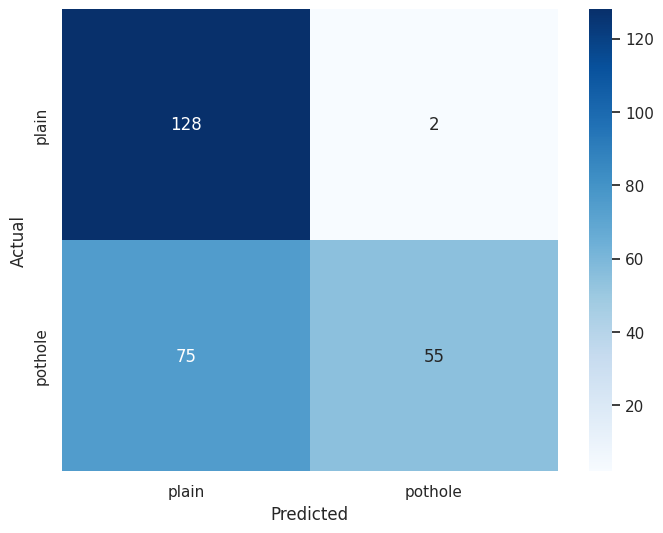

In [ ]:

precision = precision_score(true_labels, predictions)
recall = recall_score(true_labels, predictions)
f1 = f1_score(true_labels, predictions)
accuracy = accuracy_score(true_labels, predictions)

print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")
print(f"Accuracy: {accuracy}")


conf_matrix = confusion_matrix(true_labels, predictions)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()
